In [2]:
#EDA

In [3]:
# Importing required libraries.
import numpy as np
import pandas as pd
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import plotly.express as px
import pandas as pd
import numpy as np
import itertools
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, acf, pacf,arma_order_select_ic
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_model import ARIMA
from sklearn.model_selection import train_test_split
import warnings
warnings.simplefilter('ignore')
import pandas as pd
import numpy as np
import seaborn as sns #visualisation
import matplotlib.pyplot as plt #visualisation
%matplotlib inline
import plotly.graph_objs as go#visualization
from plotly.offline import iplot
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import  accuracy_score,precision_score,recall_score,f1_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
import warnings
warnings.filterwarnings('ignore')
sns.set(color_codes=True)
import plotly.express as px

import matplotlib.pyplot as plt
import seaborn as sns
     


# Load data
from google.colab import drive

drive.mount('/content/drive')

path = "/content/drive/MyDrive/Colab Notebooks/cleaned_data.csv"
#df= pd.read_csv(path)

#data= pd.read_csv("cleaned_data_csv.csv")

Mounted at /content/drive


In [4]:
data= pd.read_csv(path)

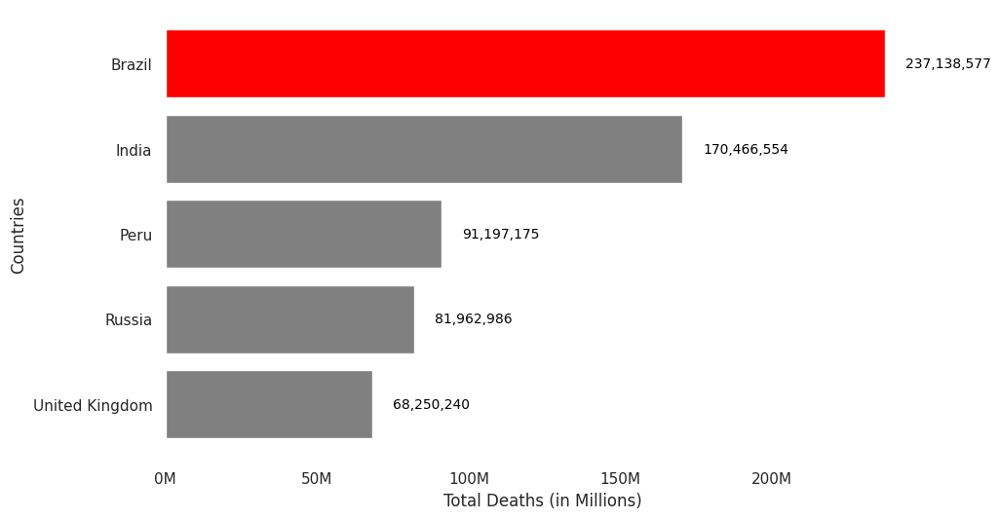

In [34]:
import matplotlib.pyplot as plt

Locations = ['World', 'Asia', 'Upper middle income', 'Lower middle income', 'Europe','High income', 'South America','European Union']

# filter data to include only selected continents
filtered_data = data[data['Continent'].isin(Locations)]

# group filtered data by continent and sum new cases
continent_data = filtered_data.groupby('Location')['Total deaths'].sum()

continent_data = continent_data.sort_values(ascending=False)[:5]

continent_data = continent_data.sort_values(ascending=True)

max_value = continent_data.max()
colors = ['grey' if v != max_value else 'red' for v in continent_data.values]

fig, ax = plt.subplots(figsize=(10, 6))

# create a horizontal bar chart with different colors
ax.barh(continent_data.index, continent_data.values, color=colors)

# add numerical values to the bars
for i, (value, name) in enumerate(zip(continent_data.values, continent_data.index)):
    ax.annotate("{:,.0f}".format(value),
                xy=(value, i),  # position of the bar value
                ha='left', va='center', fontsize=10, 
                color='black', textcoords='offset points', 
                xytext=(15, 0))

# format x-axis ticks to display values in millions
xticklabels = [f"{x/1_000_000:.0f}M" for x in ax.get_xticks()]
ax.set_xticklabels(xticklabels)

# set x-axis and y-axis labels
plt.xlabel('Total Deaths (in Millions)')
ax.set_ylabel('Countries')

# set background color to white
ax.set_facecolor('white')

# display the plot
plt.show()


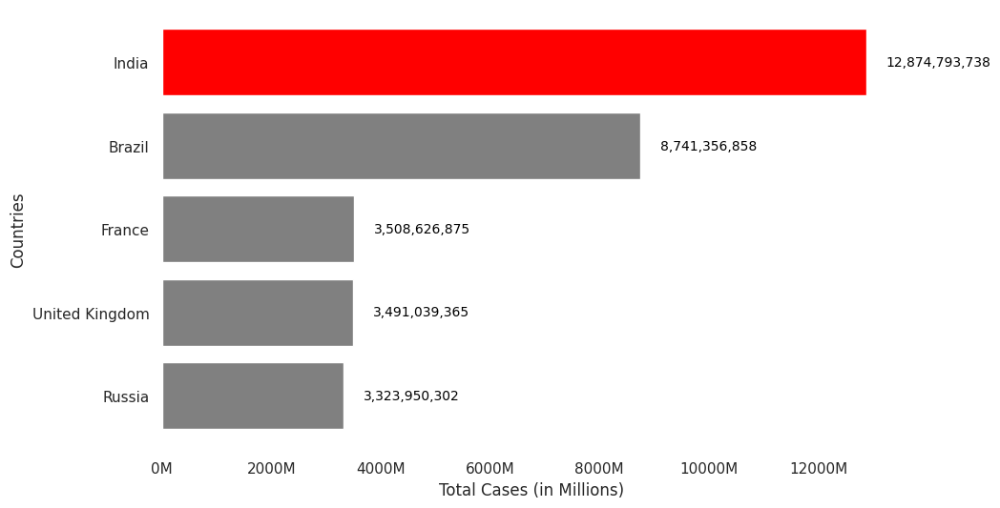

In [33]:
import matplotlib.pyplot as plt

Locations = ['World', 'Asia', 'Upper middle income', 'Lower middle income', 'Europe','High income', 'South America','European Union']

# filter data to include only selected continents
filtered_data = data[data['Continent'].isin(Locations)]

# group filtered data by continent and sum new cases
continent_data = filtered_data.groupby('Location')['Total Cases'].sum()

continent_data = continent_data.sort_values(ascending=False)[:5]

continent_data = continent_data.sort_values(ascending=True)

max_value = continent_data.max()
colors = ['grey' if v != max_value else 'red' for v in continent_data.values]

fig, ax = plt.subplots(figsize=(10, 6))

# create a horizontal bar chart with different colors
ax.barh(continent_data.index, continent_data.values, color=colors)

# add numerical values to the bars
for i, (value, name) in enumerate(zip(continent_data.values, continent_data.index)):
    ax.annotate("{:,.0f}".format(value),
                xy=(value, i),  # position of the bar value
                ha='left', va='center', fontsize=10, 
                color='black', textcoords='offset points', 
                xytext=(15, 0))

# format x-axis ticks to display values in millions
xticklabels = [f"{x/1_000_000:.0f}M" for x in ax.get_xticks()]
ax.set_xticklabels(xticklabels)

# set x-axis and y-axis labels
plt.xlabel('Total Cases (in Millions)')
ax.set_ylabel('Countries')

# set background color to white
ax.set_facecolor('white')

# display the plot
plt.show()


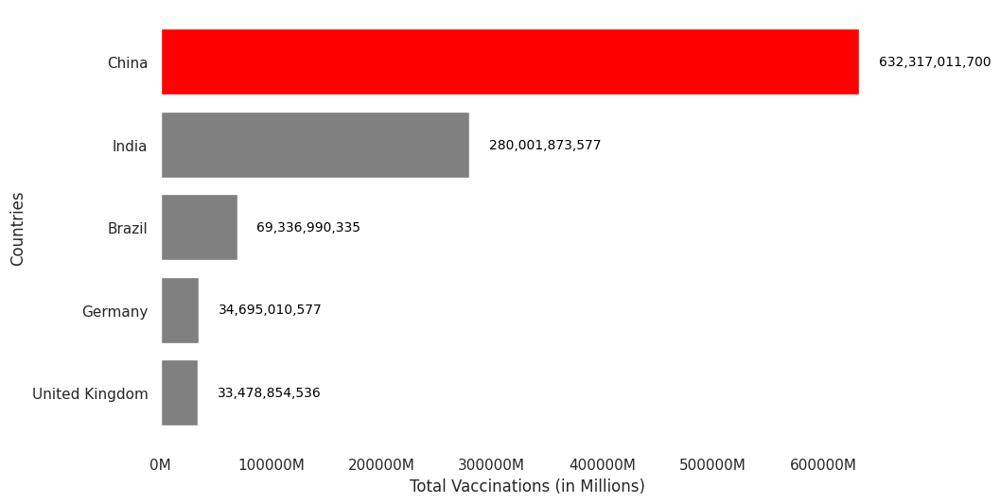

In [9]:
import matplotlib.pyplot as plt

Locations = ['World', 'Asia', 'Upper middle income', 'Lower middle income', 'Europe','High income', 'South America','European Union']

# filter data to include only selected continents
filtered_data = data[data['Continent'].isin(Locations)]

# group filtered data by continent and sum new cases
continent_data = filtered_data.groupby('Location')['total vaccinations'].sum()

continent_data = continent_data.sort_values(ascending=False)[:5]

continent_data = continent_data.sort_values(ascending=True)

max_value = continent_data.max()
colors = ['grey' if v != max_value else 'red' for v in continent_data.values]

fig, ax = plt.subplots(figsize=(10, 6))

# create a horizontal bar chart with different colors
ax.barh(continent_data.index, continent_data.values, color=colors)

# add numerical values to the bars
for i, (value, name) in enumerate(zip(continent_data.values, continent_data.index)):
    ax.annotate("{:,.0f}".format(value),
                xy=(value, i),  # position of the bar value
                ha='left', va='center', fontsize=10, 
                color='black', textcoords='offset points', 
                xytext=(15, 0))

# format x-axis ticks to display values in millions
xticklabels = [f"{x/1_000_000:.0f}M" for x in ax.get_xticks()]
ax.set_xticklabels(xticklabels)

# set x-axis and y-axis labels
plt.xlabel('Total Vaccinations (in Millions)')
ax.set_ylabel('Countries')

# set background color to white
ax.set_facecolor('white')

# display the plot
plt.show()


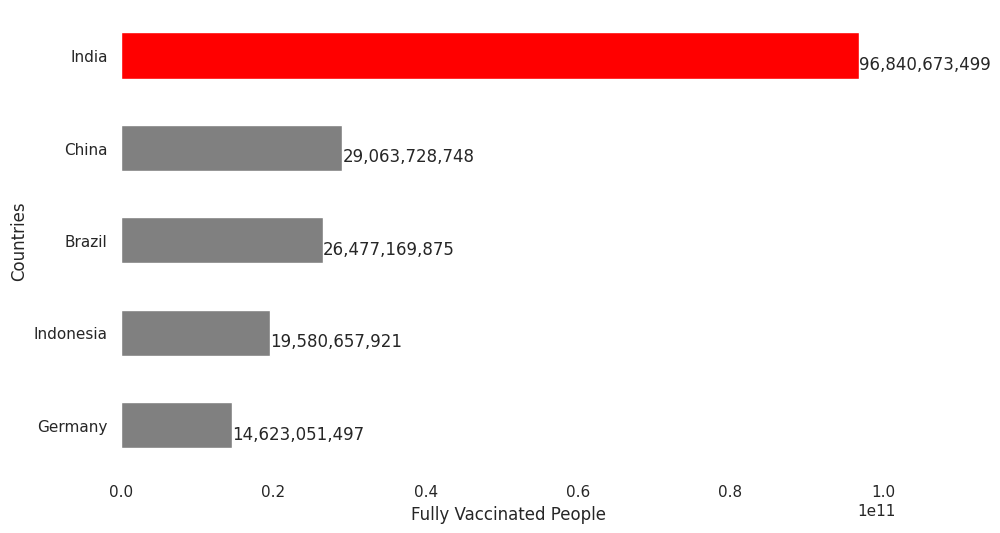

In [10]:
import matplotlib.pyplot as plt

# filter data to exclude Antarctica
#filtered_data = data[data['Location'] != 'World']

Locations = ['World', 'Asia', 'Upper middle income', 'Lower middle income', 'Europe','High income', 'South America','European Union']

# filter data to include only selected continents
filtered_data = data[data['Continent'].isin(Locations)]


# group filtered data by continent and sum new cases
continent_data = filtered_data.groupby('Location')['people fully vaccinated'].sum()


continent_data = continent_data.sort_values(ascending=False)[:5]

continent_data = continent_data.sort_values(ascending=True)
# create a horizontal bar chart with different colors
#colors = [ 'grey','grey', 'grey', 'grey' ,'red']
#ax = continent_data.plot(kind='barh', color=colors, figsize=(10,6))

max_value = continent_data.max()
colors = ['grey' if v != max_value else 'red' for v in continent_data.values]
ax = continent_data.plot(kind='barh', color=colors, figsize=(10, 6))

# add numerical values to the bars
#for i, v in enumerate(continent_data):
   # ax.text(v + 50, i - 0.15, str(v))

for i, v in enumerate(continent_data):
    ax.text(v + 50000000, i - 0.15, "{:,.0f}".format(v))

# set x-axis label
plt.xlabel('Fully Vaccinated People')

plt.ylabel('Countries')

# set background color to white
ax.set_facecolor('white')

# display the plot
plt.show()

Text(0, 0.5, 'New cases')

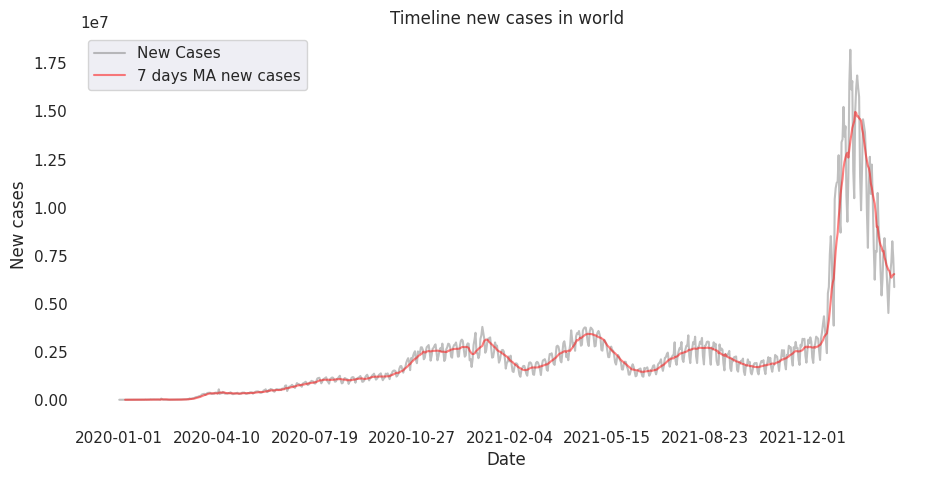

In [11]:
data2=data.copy()
data2 = data.copy()
data2.date = pd.to_datetime(data2['Date'])
data2 = data2.groupby('Date').sum()
data2['7 days MA new cases'] = 0
data2['7 days MA new cases'] = data2['New Cases'].rolling(7).mean() 
data2['7 days MA new deaths'] = 0
data2['7 days MA new deaths'] = data2['New deaths'].rolling(7).mean()
colors = ['grey', 'red']
data2[['New Cases', '7 days MA new cases']].plot(figsize = (11, 5), alpha = 0.5, color=colors).set_facecolor('white')
plt.grid(False)
plt.title('Timeline new cases in world')
plt.xlabel('Date')
plt.ylabel('New cases')

Text(0, 0.5, 'New deaths')

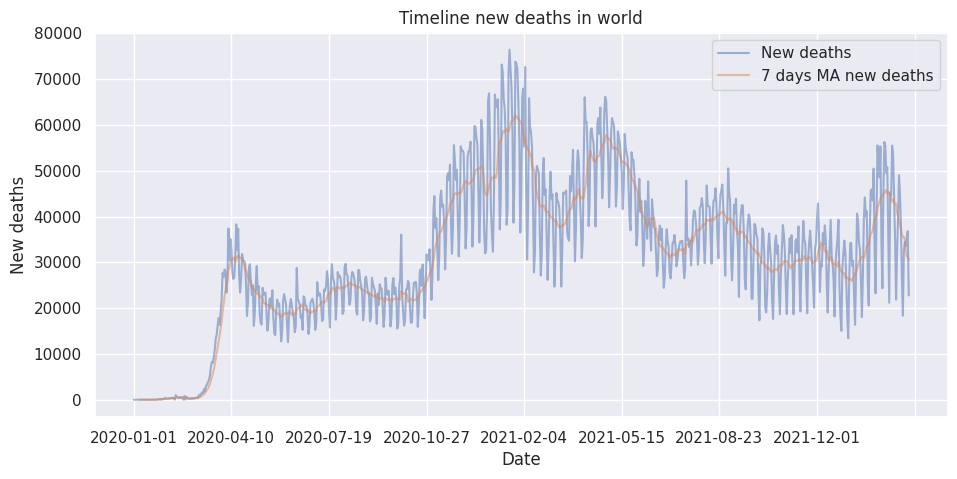

In [12]:
data2[['New deaths', '7 days MA new deaths']].plot(figsize = (11, 5), alpha = 0.5)
plt.title('Timeline new deaths in world')
plt.xlabel('Date')
plt.ylabel('New deaths')

In [13]:
def create_and_plot_df(df, country):
    #Selecting the 7 key columns for country in dataset
    df=df[df['Location']==country].copy()
    df=df[['Date','Total Cases','New Cases',
         'Total deaths','New deaths',
         "people vaccinated per hundred", "people fully vaccinated per hundred",
         "total deaths per million","new cases per million"]].copy()

    #Convert to datetime
    df.date = pd.to_datetime(df['Date'])
    #Fixing the mistakes in uk data.
    if country=='United Kingdom':
        df.loc[df['Date']=='2022-01-31','New Cases'] = 92368
        df.loc[df['Date']=='2022-02-01','New deaths'] = 219
        df.loc[df['Date']=='2022-01-31',"new cases per million"] = 1354
        df.loc[df['Date']=='2022-02-01',"total deaths per million"] = 3.211
        df.loc[df['Date']=='2021-04-09','New Cases'] = 3150
        df.loc[df['Date']=='2021-04-09',"new cases per million"] = 46
        df.loc[df['Date']=='2021-05-18','New Cases'] = 2412
        df.loc[df['Date']=='2021-05-18',"new cases per million"] = 35
    else:
        pass
  
    #Set the date as index and compute moving average with window=7 for new_cases and new_deaths
    df.set_index('Date', inplace=True)
    df['7 days MA new cases'] = 0
    df['7 days MA new cases'] = df['New Cases'].rolling(7).mean()
    df['7 days MA new deaths'] = 0
    df['7 days MA new deaths'] = df['New deaths'].rolling(7).mean()
    df['7 days MA new cases per million'] = 0
    df['7 days MA new cases per million'] = df["new cases per million"].rolling(7).mean()
    df['7 days MA new deaths per million'] = 0
    df['7 days MA new deaths per million'] = df["total deaths per million"].rolling(7).mean()
  
    #Plot new cases, new deaths and people vaccinated 
    df[['New Cases', '7 days MA new cases']].plot(figsize = (15, 5), alpha = 0.5)
    plt.title(f'Timeline new cases in {country}')

    df[['New deaths', '7 days MA new deaths']].plot(figsize = (15, 5), alpha = 0.5)
    if country=='Chile':
        plt.ylim([0,400])
    else:
        pass
    plt.title(f'Timeline new deaths in {country}')



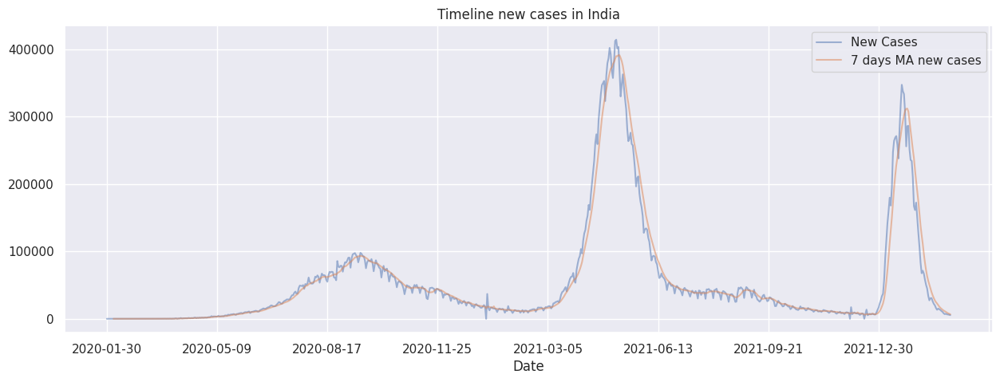

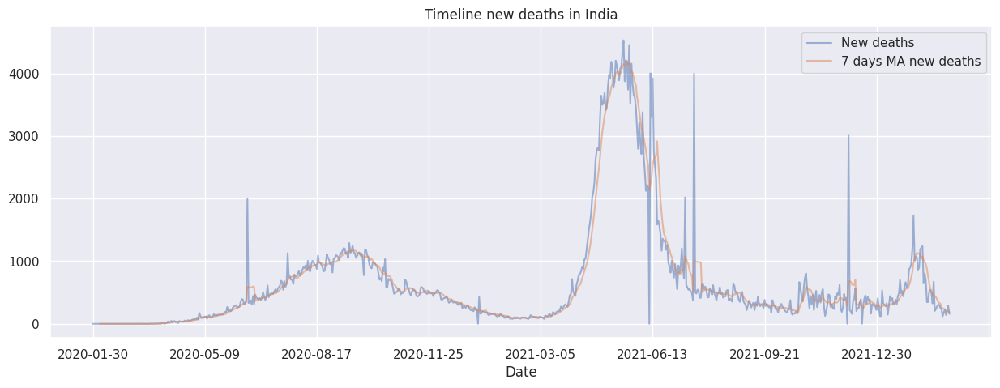

In [14]:
df_india=create_and_plot_df(data,'India')

In [15]:
import seaborn as sns

<Axes: xlabel='Total Cases', ylabel='total tests'>

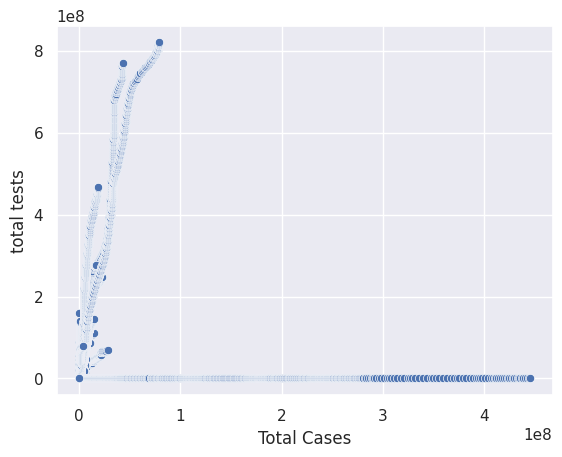

In [16]:
sns.scatterplot(x='Total Cases',y="total tests",data=data)

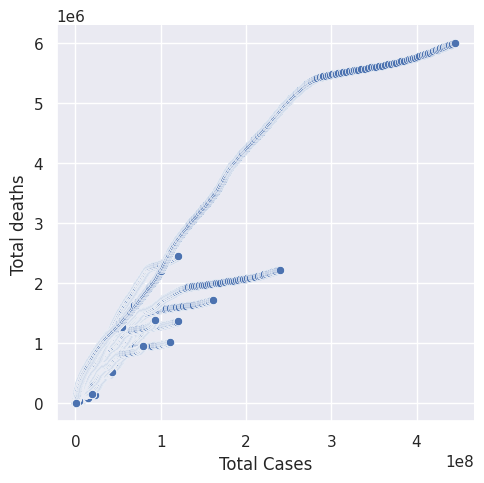

In [17]:
sns.relplot(x="Total Cases",y="Total deaths",data=data)

In [18]:
#sns.pairplot(data)

In [19]:
def plot_map(data, col, pal):
    df = data[data[col]>0]
    fig = px.choropleth(df, locations="Location",locationmode='country names', 
                  color=col, hover_name="Location", 
                  title=col, hover_data=[col], color_continuous_scale=pal)
#     fig.update_layout(coloraxis_showscale=False)
    fig.show()

In [20]:
#plot_map(data, 'Total Cases', 'matter')

In [21]:
def plot_daywise(col, hue):
    fig = px.bar(data, x="Date", y=col, width=700, color_discrete_sequence=[hue])
    fig.update_layout(title=col, xaxis_title="", yaxis_title="")
    fig.show()

In [22]:
plot_daywise('New Cases', '#333333')

In [23]:
def plot_stacked(col):
    fig = px.bar(data, x="Date", y=col, color='Continent', 
                 height=600, title=col, 
                 color_discrete_sequence = px.colors.cyclical.mygbm)
    fig.update_layout(showlegend=True)
    fig.show()

In [24]:
plot_stacked('Total Cases')

In [25]:
def plot_treemap(col):
    fig = px.treemap(data, path=["Continent"], values=col, height=700,
                 title=col, color_discrete_sequence = px.colors.qualitative.Dark2)
    fig.data[0].textinfo = 'label+text+value'
    fig.show()

In [26]:
plot_treemap('Total Cases')

In [27]:
fig = px.pie(data, values = "New deaths", names = "Continent", title = "Total Deaths in the World", hole = 0.4)
fig.show()

In [28]:
px.scatter(data_frame = data, x='Total Cases',y='Total deaths',
           color='Continent',
           title='The relation between the Active and death cases',
          log_x= True,
          range_y=[25,95],
           animation_frame= 'Date'  
          )

In [29]:
conditioned_data = data[data['Location'] != "World"]
condtion= conditioned_data[conditioned_data['Location'] !="High income"]

def plot_treemap(col):
    fig = px.treemap(condtion, path=["Location"], values=col, height=700,
                 title=col, color_discrete_sequence = px.colors.qualitative.Dark2)
    fig.data[0].textinfo = 'label+text+value'
    fig.show()

In [30]:
plot_treemap('New Cases')

In [31]:
fig = px.pie(data, values = "total tests", names = "Continent", title = "Total Testing", hole = 0.4)
fig.show()

In [32]:
fig = px.pie(data, values = "total vaccinations", names = "Continent", title = "Total Deaths in the World", hole = 0.4)
fig.show()